---

<h1 style="color:#012eba">Introduction to Image Processing with Python</h1>
<h1 style="color:#012eba">Episode 2: Image Enhancements, Part 2. White balancing</h1>

---

*DASCI 261 - Introduction to Image Processing*

*Prepared by Erika G. Lacson*

---
<h2 style="color:#ff0090">Introduction</h2>

Welcome to the next part of our image processing series, where we explore the crucial process of white balancing. If you have ever taken a photo that looked dull, discolored, or had an unnatural color cast, then you understand the importance of white balancing. In this blog, we will dive deep into the concepts of white balancing and explore various algorithms to improve the color accuracy and quality of your images. So, let’s get started and learn how to enhance the color balance of your images using white balancing techniques.


---
<h2 style="color:#ff0090">White balancing</h2>

<b>White balancing</b> is a technique used to correct color casts in images caused by different lighting conditions. It is a process of adjusting the colors of an image to make whites appear white, rather than tinted with different shades of colors. This is important for ensuring that colors in an image are accurate and that they appear natural to the human eye.

In this part of Episode 2, I will discuss three popular white balancing algorithms: white patch, gray-world, and ground-truth algorithms. We will go through each algorithm and explore how to implement them in Python using the following libraries:

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage import io, img_as_ubyte
from skimage.io import imread, imshow
from matplotlib.patches import Rectangle

and the image below with blue overcast:

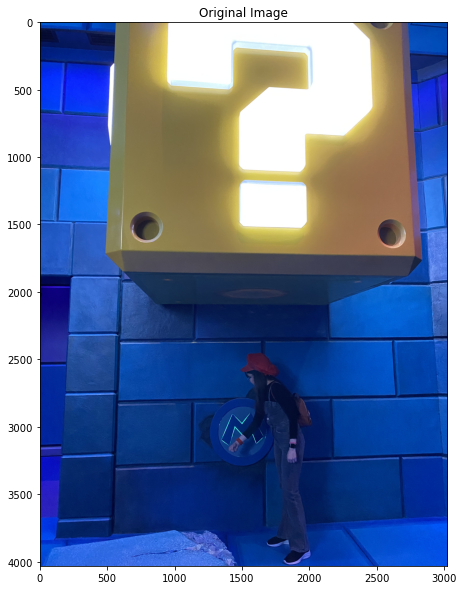

In [23]:
image = io.imread('qmark.png')
plt.figure(figsize=(10,10))
plt.title('Original Image')
plt.imshow(image)
plt.show()

Output #1: Photo by Author

To confirm whether the image has a color cast, let’s use the following function (which will also be handy in applying the white patch algorithm):

In [6]:
def calc_color_overcast(image):
    # Calculate color overcast for each channel
    red_channel = image[:, :, 0]
    green_channel = image[:, :, 1]
    blue_channel = image[:, :, 2]

    # Create a dataframe to store the results
    channel_stats = pd.DataFrame(columns=['Mean', 'Std', 'Min', 'Median', 
                                          'P_80', 'P_90', 'P_99', 'Max'])

    # Compute and store the statistics for each color channel
    for channel, name in zip([red_channel, green_channel, blue_channel], 
                             ['Red', 'Green', 'Blue']):
        mean = np.mean(channel)
        std = np.std(channel)
        minimum = np.min(channel)
        median = np.median(channel)
        p_80 = np.percentile(channel, 80)
        p_90 = np.percentile(channel, 90)
        p_99 = np.percentile(channel, 99)
        maximum = np.max(channel)

        channel_stats.loc[name] = [mean, std, minimum, median, p_80, p_90, p_99, maximum]

    return channel_stats


In [25]:
calc_color_overcast(image)

,Mean,Std,Min,Median,P_80,P_90,P_99,Max
Red,70.480999,84.556637,0.0,26.0,152.0,220.0,255.0,255.0
Green,93.872098,66.168849,0.0,73.0,128.0,213.0,255.0,255.0
Blue,142.225958,62.501719,0.0,126.0,206.0,253.0,255.0,255.0


Output #2: Pandas DataFrame containing the image channel statistics

From the results shown in the dataframe above, it is evident that there is a blue cast in the image. This is indicated by the blue channel having the highest mean, median, and values for each percentile. It is also noteworthy that the maximum values for all three color channels are equal to 255, which is an important consideration for the White Patch Algorithm discussion that will follow.

---
<h2 style="color:#ff0090">1. White Patch Algorithm</h2>


The white patch algorithm is a color balancing method in image processing that aims to correct color casts in an image by scaling the color channels so that the brightest pixels in each channel become white. This is done by assuming that the brightest pixel in the image is white.

**Pros:**

- Simple and easy to implement.
- Effective in correcting white balance issues in images with a dominant white area or neutral gray area.
- Works well when there is a distinct bright area in the image.

**Cons:**

- Assumes the brightest color in the image is white, which may not always be true.
- Can lead to over-correction if the assumption does not hold, resulting in unnatural colors or artifacts.
- Can result in color shifts or artifacts in some areas of the image.

**When it works best:**

- Scenes with a controlled environment, where the brightest point is known to be white.
- When the lighting conditions are consistent across the image.

**When it doesn't work:**

- When there are multiple light sources or mixed lighting conditions in the image.
- When the reference area is not representative of the overall lighting conditions.
- When the lighting conditions are not consistent across the image.

Now that you know about the advantages and limitations of using white patch algorithm, let’s try it to our sample image:

In [26]:
def white_patch(image, percentile=100):
    """
    Returns a plot comparison of original and corrected/white balanced image 
    using the White Patch algorithm.

    Parameters
    ----------
    image : numpy array
            Image to process using white patch algorithm
    percentile : integer, optional
                  Percentile value to consider as channel maximum
    """
    white_patch_image = img_as_ubyte(
        (image * 1.0 / np.percentile(image, 
                                     percentile, 
                                     axis=(0, 1))).clip(0, 1))
    # Plot the comparison between the original & white patch corrected images
    fig, ax = plt.subplots(1, 2, figsize=(14, 10))
    ax[0].imshow(image)
    ax[0].set_title('Original Image')
    ax[0].axis('off')

    ax[1].imshow(white_patch_image, cmap='gray')
    ax[1].set_title('White Patch Corrected Image')
    ax[1].axis('off')

    plt.show()

In [27]:
# Read the input image
image = imread('qmark.png')

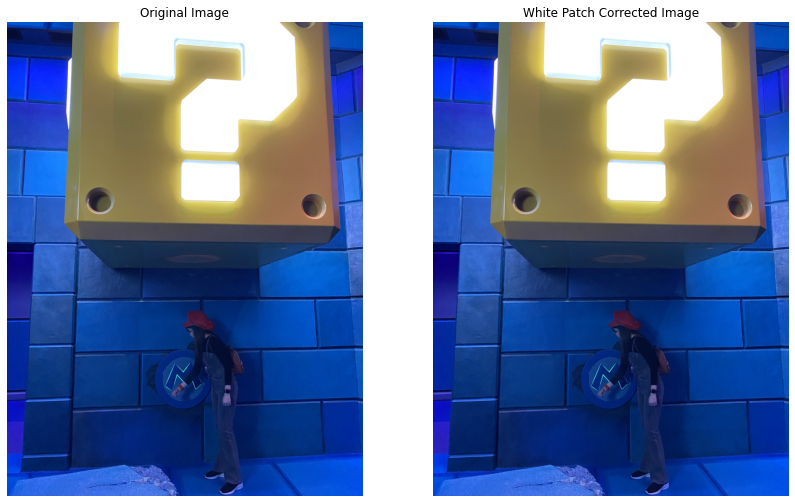

In [28]:
# Call the function to implement white patch algorithm
white_patch(image, 100)

Output #3: (Left): Original Photo by Author| (Right): White Patch Corrected Image using percentile=100 by Author

Using the default percentile=100 did not improve our image because the image has [255, 255, 255] RGB max values, as shown in the calc_color_overcast(image) function earlier:

In [29]:
calc_color_overcast(image)

,Mean,Std,Min,Median,P_80,P_90,P_99,Max
Red,70.480999,84.556637,0.0,26.0,152.0,220.0,255.0,255.0
Green,93.872098,66.168849,0.0,73.0,128.0,213.0,255.0,255.0
Blue,142.225958,62.501719,0.0,126.0,206.0,253.0,255.0,255.0


To address the above issue, we can consider lower percentile of the pixel values as the maximum value instead of the absolute maximum (since [255, 255, 255] represents white in the RGB color space). This method helps to avoid over-correction caused by extreme pixel values that are not representative of the overall image.



So let's explore 85th percentile:

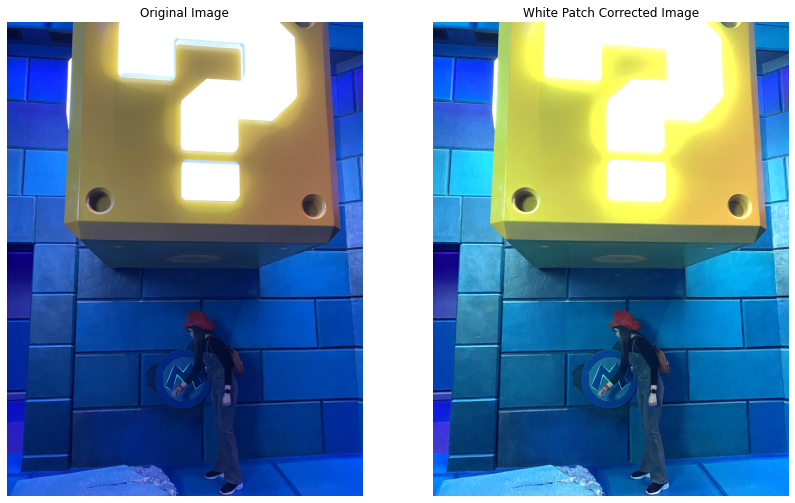

In [30]:
white_patch(image, 85)

Output #4: (Left): Original Photo by Author| (Right): White Patch Corrected Image using percentile=85 by Author

Using the 85th percentile correctly improved the color of the image. The following colors were correctly assigned:

- Question mark block: Yellow
- Mario hat: Red
- Backpack: Brown
- Shoes: Black and White
- Walls: Different shades of Blue

Well done, white patch!

Now, let's try the next algorithm, Gray-world:

---
<h2 style="color:#ff0090">2. Gray-world Algorithm</h2>

The Gray-world algorithm assumes that the average color of the image should be gray. It adjusts the color channels accordingly to correct the color cast.
**Pros:**

- Simple and computationally efficient.
- Assumes that the average color of the image is gray, which is often a reasonable assumption for general scenes.

**Cons:**

- Can be sensitive to the presence of large areas of a single dominant color, resulting in incorrect color balance.
- Assumes that the average color of the image should be gray, which may not always be true.

**When it works best:**

- Images with a variety of colors and no single dominant color.
- Scenes with an evenly distributed color spectrum.

**When it doesn't work:**

- Images with a large area of a single dominant color, which may cause the algorithm to over-correct.
- Scenes with a specific color cast, where the average color is not gray.

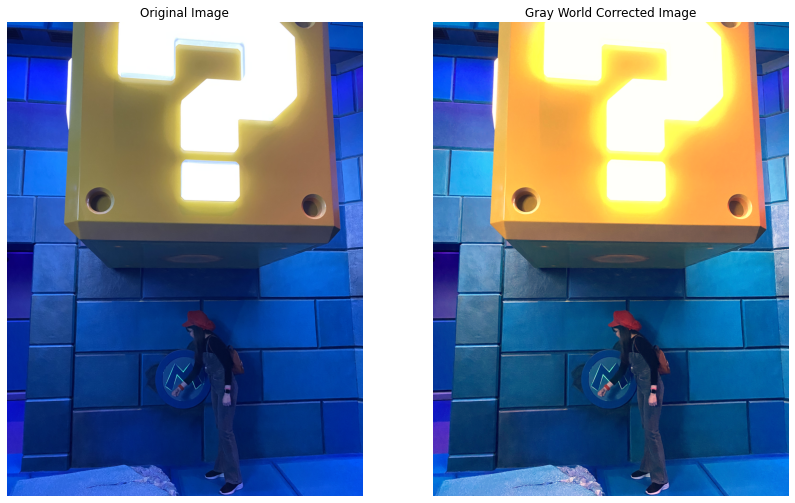

In [31]:
def gray_world(image):
    """
    Returns a plot comparison of original and corrected/white balanced image 
    using the Gray World algorithm.

    Parameters
    ----------
    image : numpy array
            Image to process using gray world algorithm
    """
    # Apply the Gray World algorithm
    image_grayworld = ((image * (image.mean() / image.mean(axis=(0, 1)))).clip(0, 255).astype(int))

    # Exclude alpha or opacity channel (transparency)
    if image.shape[2] == 4:
        image_grayworld[:, :, 3] = 255

    # Plot the comparison between the original and gray world corrected images
    fig, ax = plt.subplots(1, 2, figsize=(14, 10))
    ax[0].imshow(image)
    ax[0].set_title('Original Image')
    ax[0].axis('off')

    ax[1].imshow(image_grayworld)
    ax[1].set_title('Gray World Corrected Image')
    ax[1].axis('off')

    plt.show()

# Call the function to apply the Gray World algorithm
gray_world(image)

Output #5: (Left): Original Photo by Author| (Right): Gray-world Corrected Image by Author

Gray-world algorithm in this example provided a more tamed result than that of the white patch algorithm. Because of the gray average color assumption, it did not perfectly convert the question mark block to yellow, but the reds, blues, whites, blacks, and browns were enhanced correctly.

Let’s try the last of the three common white balancing algorithms, the ground truth algorithm.

---
<h2 style="color:#ff0090">3. Ground Truth Algorithm</h2>

The Ground Truth algorithm requires a reference white color from a known object in the image. It adjusts the color channels based on this reference to correct the color cast.

**Pros:**

- Provides accurate color correction when a reference white patch is available.
- Allows for precise control over the reference color, making it suitable for professional applications.

**Cons:**

- Requires a known reference white patch in the image, which may not always be available.
- Less automated compared to the other two methods, as it needs manual input for the reference patch coordinates.

**When it works best:**

- Images with a known reference white patch, such as color charts or calibration targets.
- Controlled environments, such as studios, where a reference white object can be placed in the scene.

**When it doesn't work:**

- Images without a known reference white patch.
- Scenes with multiple light sources with different color temperatures, which may cause complex color casts.


In [32]:
def ground_truth(image, img_patch, mode='mean'):
    """
    Returns a plot comparison of original and corrected/white balanced image 
    using the Ground Truth algorithm.

    Parameters
    ----------
    image : numpy array
            Image to process using ground truth algorithm
    img_patch : numpy array
                Reference image patch
    mode : string, optional
           Calculation mode, either 'mean' or 'max'
    """
    if mode == 'mean':
        image_gt = ((image * (img_patch.mean() / image.mean(axis=(0, 1)))).clip(0, 255).astype(int))
    if mode == 'max':
        image_gt = ((image * 1.0 / img_patch.max(axis=(0, 1))).clip(0, 1))

    # Exclude alpha or opacity channel (transparency)
    if image.shape[2] == 4:
        image_gt[:, :, 3] = 255

    # Plot the comparison between the original and ground truth corrected images
    fig, ax = plt.subplots(1, 2, figsize=(14, 10))
    ax[0].imshow(image)
    ax[0].set_title('Original Image')
    ax[0].axis('off')

    ax[1].imshow(image_gt)
    ax[1].set_title('Ground Truth Corrected Image')
    ax[1].axis('off')

    plt.show()

Considering that under normal light, the question mark block looks like this:

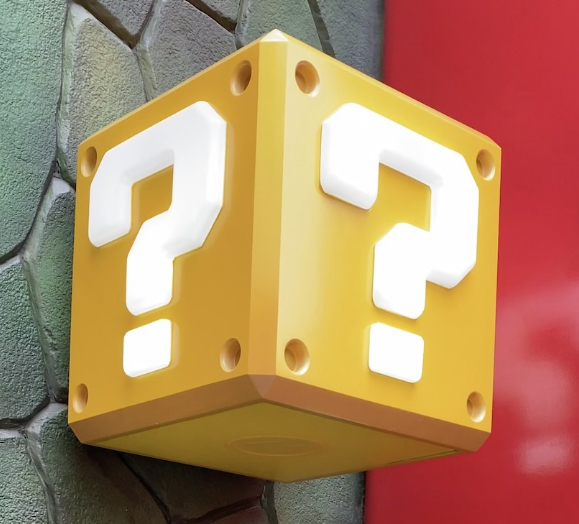

Reference image colors for the block. Photo by Author

We can set any square block inside the question mark as our ground truth image patch to represent white:

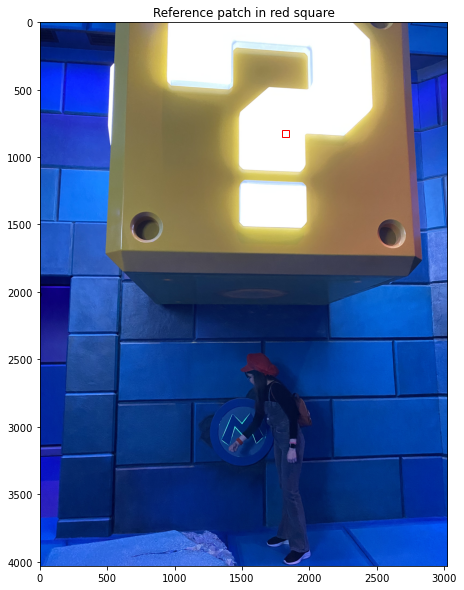

In [33]:
fig, ax = plt.subplots(figsize=(10,10))
ax.set_title('Reference patch in red square')
ax.imshow(image)
ax.add_patch(Rectangle((1800, 800), 50, 50, edgecolor='r', facecolor='none'));

Output #6: Reference patch set inside the question mark, Photo by Author.

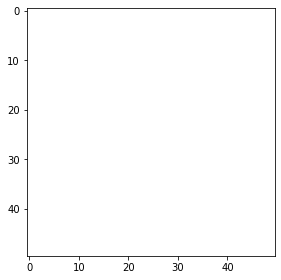

In [34]:
# To visualize the specific reference patch
img_patch = image[800:850, 1800:1850]
imshow(img_patch);

Output #7: Zoomed in image of the reference patch

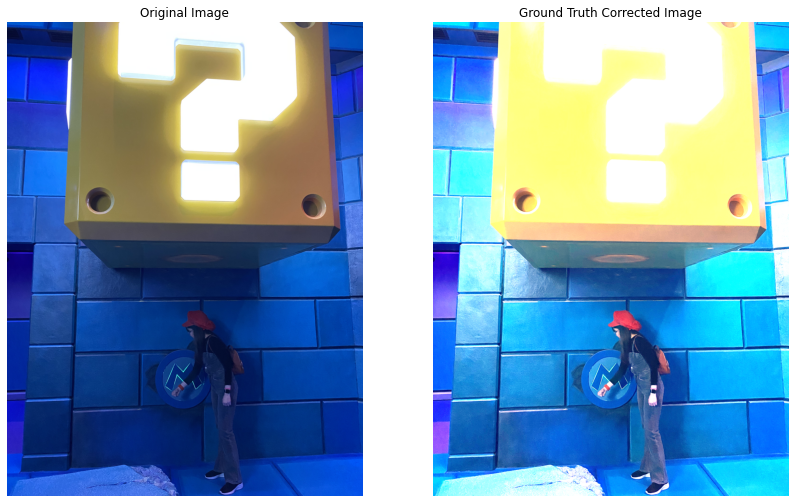

In [35]:
# Call the function to apply the Ground Truth algorithm
ground_truth(image, img_patch, mode='mean')

Output #8: (Left): Original Photo by Author| (Right): Ground Truth Corrected Image by Author


Using the light as the reference patch resulted in an image that appears too bright. This is because the algorithm tries to adjust the color balance based on the reference patch’s color. If the reference patch is a bright source, the algorithm may overcompensate, leading to a brightened image with washed-out colors, as evident in the above example.

Let’s try using the white sole of my shoes as the reference patch instead.

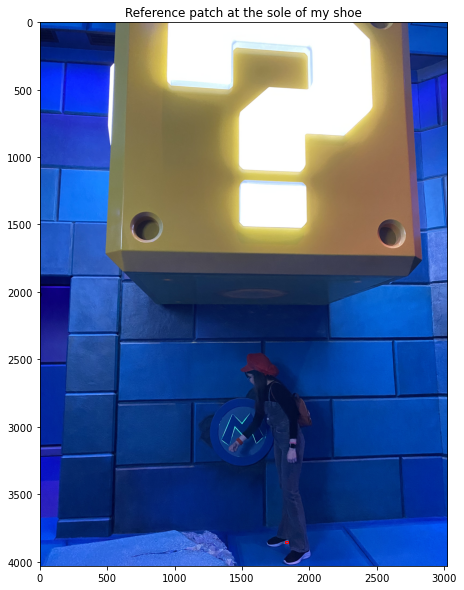

In [36]:
# Setting the sole of my shoe as the reference patch
fig, ax = plt.subplots(figsize=(14,10))
ax.set_title('Reference patch at the sole of my shoe')
ax.imshow(image)
ax.add_patch(Rectangle((1820, 3845), 20, 20, edgecolor='r', facecolor='none'));

Output #9: Setting the reference patch at the sole of my shoe, Photo by Author

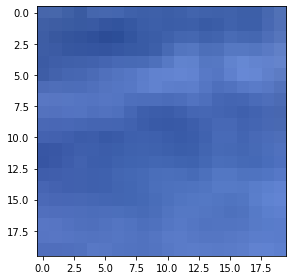

In [37]:
# To visualize the specific reference patch
img_patch = image[3845:3865, 1820:1840]
imshow(img_patch);

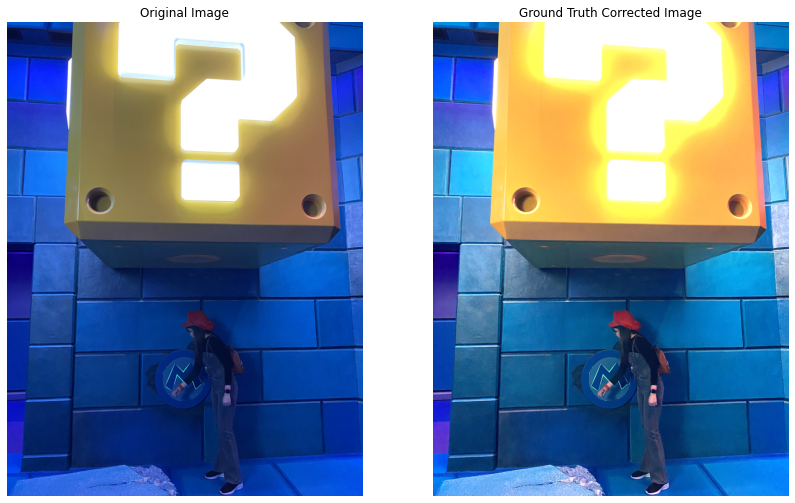

In [38]:
# Call the function to apply the Ground Truth algorithm
ground_truth(image, img_patch, mode='mean')

---
<h2 style="color:#ff0090">Combining the three algorithms</h2>

To summarize, here are the combined results of the 3 algorithms:

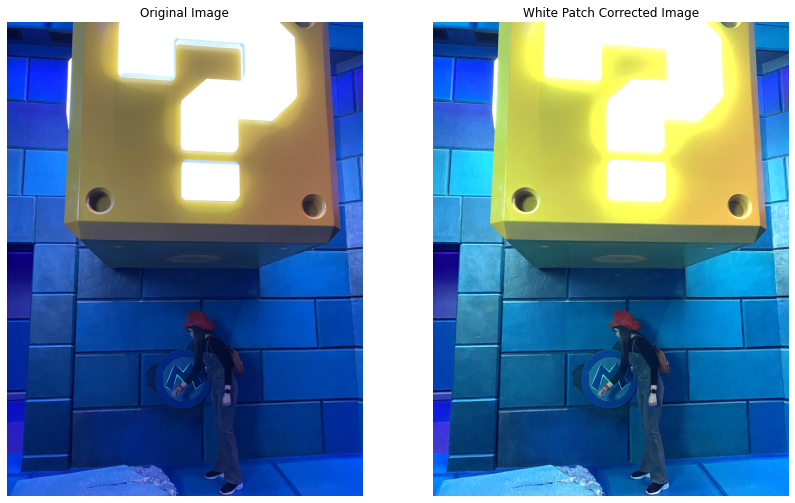

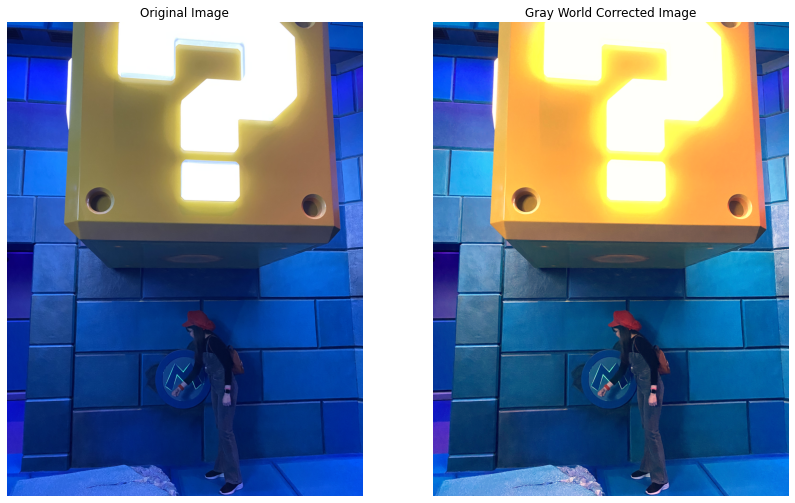

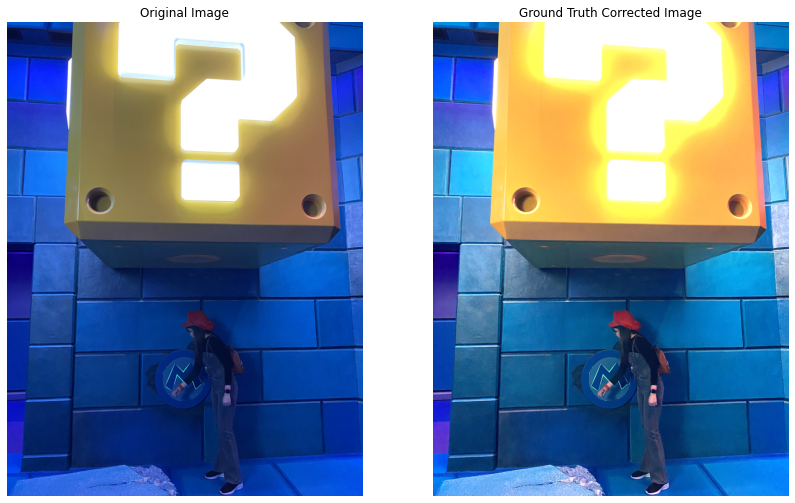

In [39]:
white_patch_image = white_patch(image, 85)
gray_world_image = gray_world(image)
ground_truth_image_mean = ground_truth(image, img_patch, mode='mean')

Output #12: Combined results of the white balancing algorithms, Photo by Author


---
<h2 style="color:#ff0090">Exercise</h2>

To gain a better grasp of the different white balancing algorithms discussed, we can test them on an old photo. Let’s combine all the libraries and functions mentioned earlier for easier reference:

In [40]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from skimage import io, img_as_ubyte
from skimage.io import imread, imshow
from matplotlib.patches import Rectangle

In [41]:
# Utility functions
def calc_color_overcast(image):
    # Calculate color overcast for each channel
    red_channel = image[:, :, 0]
    green_channel = image[:, :, 1]
    blue_channel = image[:, :, 2]

    # Create a dataframe to store the results
    channel_stats = pd.DataFrame(
        columns=['Mean', 'Std', 'Min', 'Median', 'P_80', 'P_90', 'P_99', 'Max'])

    # Compute and store the statistics for each color channel
    for channel, name in zip([red_channel, green_channel, blue_channel], ['Red', 'Green', 'Blue']):
        mean = np.mean(channel)
        std = np.std(channel)
        minimum = np.min(channel)
        median = np.median(channel)
        p_80 = np.percentile(channel, 80)
        p_90 = np.percentile(channel, 90)
        p_99 = np.percentile(channel, 99)
        maximum = np.max(channel)

        channel_stats.loc[name] = [mean, std, minimum,
                                   median, p_80, p_90, p_99, maximum]

    return channel_stats


def white_patch(image, percentile=100):
    """
    Returns a plot comparison of original and corrected/white balanced image 
    using the White Patch algorithm.

    Parameters
    ----------
    image : numpy array
            Image to process using white patch algorithm
    percentile : integer, optional
                  Percentile value to consider as channel maximum
    """
    white_patch_image = img_as_ubyte(
        (image * 1.0 / np.percentile(image,
                                     percentile,
                                     axis=(0, 1))).clip(0, 1))
    # Plot the comparison between the original and white patch corrected images
    fig, ax = plt.subplots(1, 2, figsize=(14, 10))
    ax[0].imshow(image)
    ax[0].set_title('Original Image')
    ax[0].axis('off')

    ax[1].imshow(white_patch_image, cmap='gray')
    ax[1].set_title(f'White Patch Corrected Image: {percentile}th percentile')
    ax[1].axis('off')

    plt.show()


def gray_world(image):
    """
    Returns a plot comparison of original and corrected/white balanced image 
    using the Gray World algorithm.

    Parameters
    ----------
    image : numpy array
            Image to process using gray world algorithm
    """
    # Apply the Gray World algorithm
    image_grayworld = (
        (image * (image.mean() / image.mean(axis=(0, 1)))).clip(0, 255).astype(int))

    # Exclude alpha or opacity channel (transparency)
    if image.shape[2] == 4:
        image_grayworld[:, :, 3] = 255

    # Plot the comparison between the original and gray world corrected images
    fig, ax = plt.subplots(1, 2, figsize=(14, 10))
    ax[0].imshow(image)
    ax[0].set_title('Original Image')
    ax[0].axis('off')

    ax[1].imshow(image_grayworld)
    ax[1].set_title('Gray World Corrected Image')
    ax[1].axis('off')

    plt.show()


def ground_truth(image, patch_coords, patch_size, mode='mean', patch_loc=None):
    """
    Returns a plot with the original image, reference patch, and ground truth corrected image.

    Parameters
    ----------
    image : numpy array
            Image to process using ground truth algorithm
    patch_coords : tuple of int
                   Coordinates of the reference patch (y, x)
    patch_size : tuple of int
                 Size of the reference patch (height, width)
    mode : string, optional
           Calculation mode, either 'mean' or 'max'
    """
    # Extract the specific reference patch
    img_patch = image[patch_coords[0]:patch_coords[0] + patch_size[0], patch_coords[1]:patch_coords[1] + patch_size[1]]

    # Apply the ground truth algorithm
    if mode == 'mean':
        image_gt = (
            (image * (img_patch.mean() / image.mean(axis=(0, 1)))).clip(0, 255).astype(int))
    if mode == 'max':
        image_gt = ((image * 1.0 / img_patch.max(axis=(0, 1))).clip(0, 1))

    # Exclude alpha or opacity channel (transparency)
    if image.shape[2] == 4:
        image_gt[:, :, 3] = 255

    # Visualize the original image, reference patch, and ground truth corrected image in 3 subplots
    fig, ax = plt.subplots(1, 3, figsize=(20, 10))

    # Original image with reference patch
    ax[0].imshow(image)
    ax[0].set_title("Original Image with Reference Patch")
    ax[0].add_patch(Rectangle((patch_coords[1], patch_coords[0]), patch_size[1], patch_size[0], edgecolor='r', facecolor='none'))
    ax[0].axis('off')

    # Reference patch
    ax[1].imshow(img_patch)
    ax[1].set_title(f"Reference Patch: {patch_loc}")
    ax[1].axis('off')

    # Ground truth corrected image
    ax[2].imshow(image_gt)
    ax[2].set_title(f"Ground Truth Corrected Image: {mode}")
    ax[2].axis('off')

    plt.show()

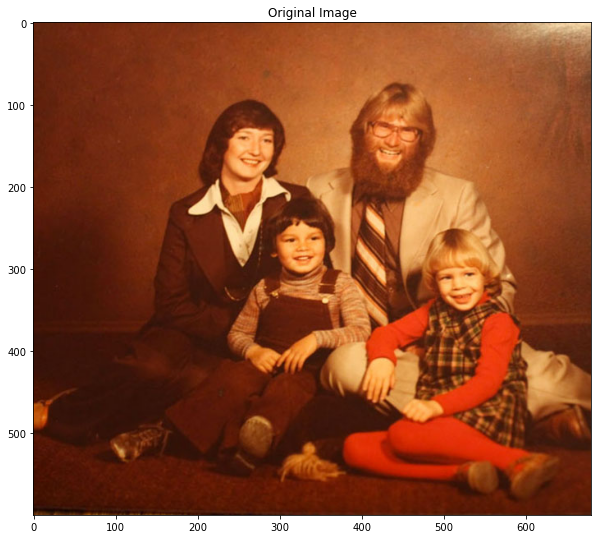

In [42]:
# Display the original image
image = io.imread('old-photo.jpg')
plt.figure(figsize=(10,10))
plt.title('Original Image')
plt.imshow(image)
plt.show()

Output # 13: Original Image for processing

In [43]:
# Check for the image channel statistics
calc_color_overcast(image)

,Mean,Std,Min,Median,P_80,P_90,P_99,Max
Red,136.185578,57.051806,20.0,124.0,193.0,224.0,254.0,255.0
Green,63.513779,45.431109,0.0,47.0,100.0,133.0,194.0,233.0
Blue,28.418113,28.448286,0.0,17.0,48.0,66.0,127.0,179.0


Output #14: Pandas DataFrame containing the image channel statistics

This particular image exhibits a red overcast which is clearly evident from both the visual inspection of the image as well as the image channel statistics.

#### White Patch Algorithm

Use different percentiles for the white patch algorithm (100th, 99th, 95th, 90th).

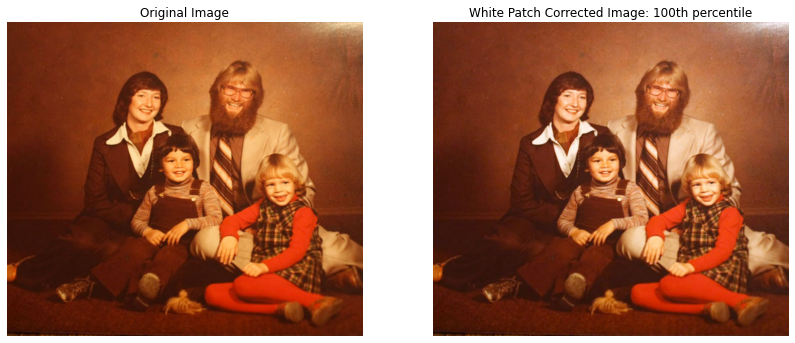

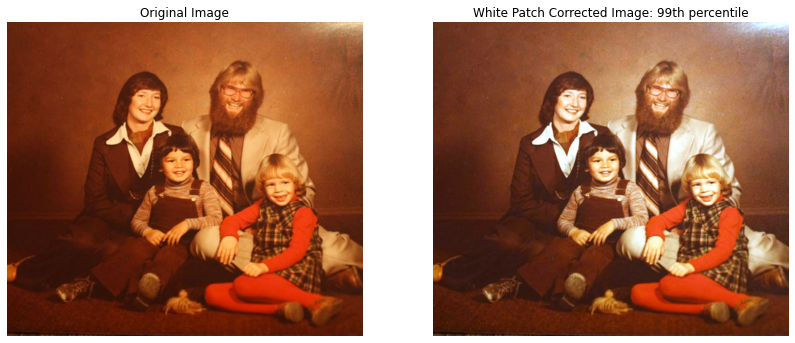

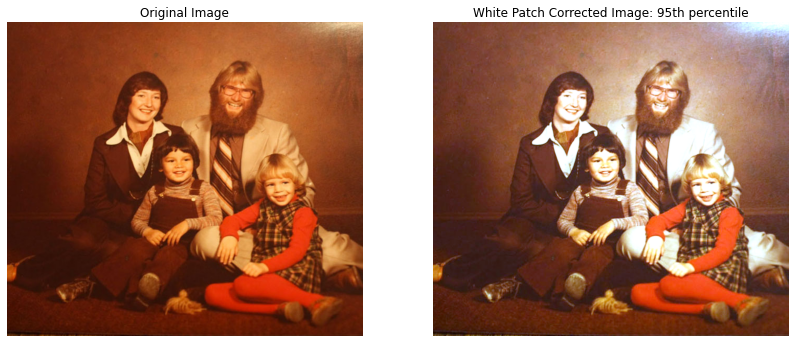

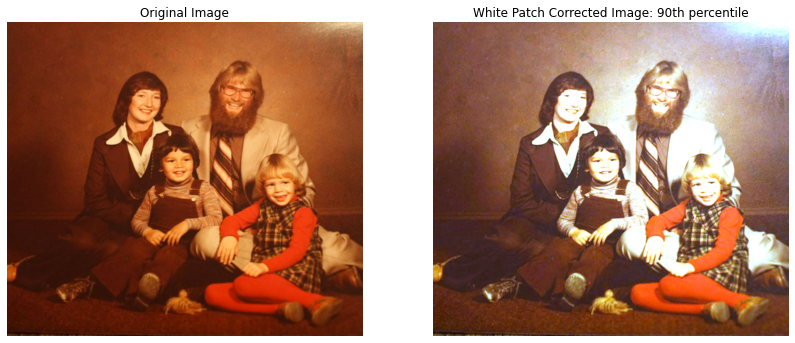

In [44]:
# Call the function to implement white patch algorithm: 100th percentile
white_patch(image, 100)

# Call the function to implement white patch algorithm: 99th percentile
white_patch(image, 99)

# Call the function to implement white patch algorithm: 95th percentile
white_patch(image, 95)

# Call the function to implement white patch algorithm: 90th percentile
white_patch(image, 90)

Output #15: Side by side comparison of the White Patch Algorithm Results

#### Gray-world Algorithm

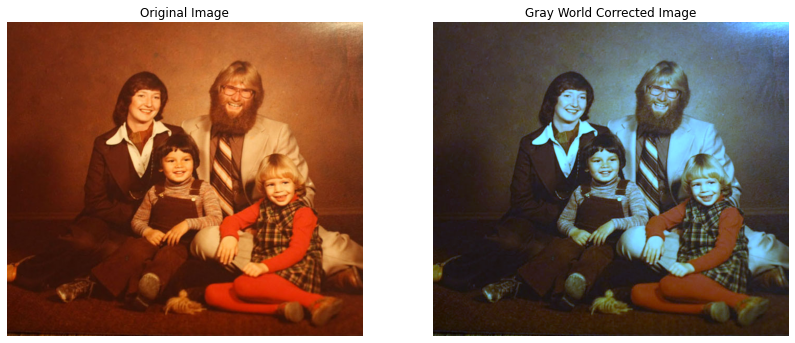

In [45]:
# Call the function to apply the Gray World algorithm
gray_world(image)

Output #16: Gray-world Algorithm Results

#### Ground Truth Algorithm

Use three reference patches for the ground-truth algorithm (i.e., lady’s collar, wall, skin).



In [46]:
# Set up reference patches:

# Lady's Collar
image_collar = io.imread('old-photo.jpg')
patch_coords_collar = (220, 202)
patch_size_collar = (9, 9)

# Wall
image_wall = io.imread('old-photo.jpg')
patch_coords_wall = (130, 320)
patch_size_wall = (40, 40)

# Skin
image_skin = io.imread('old-photo.jpg')
patch_coords_skin = (311, 530)
patch_size_skin = (10, 10)

Use the `mode=mean`:

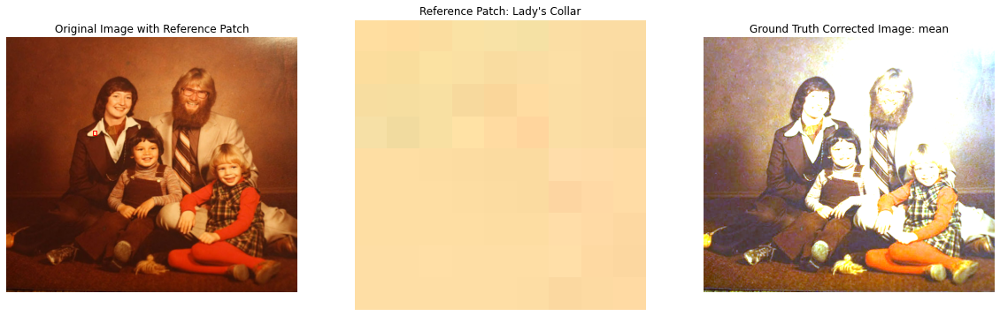

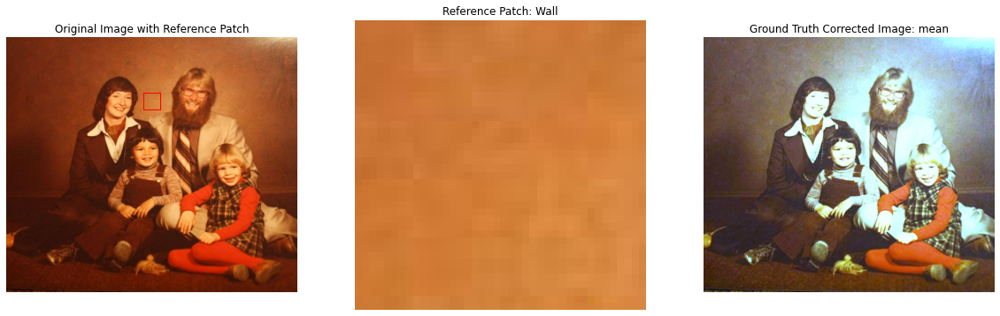

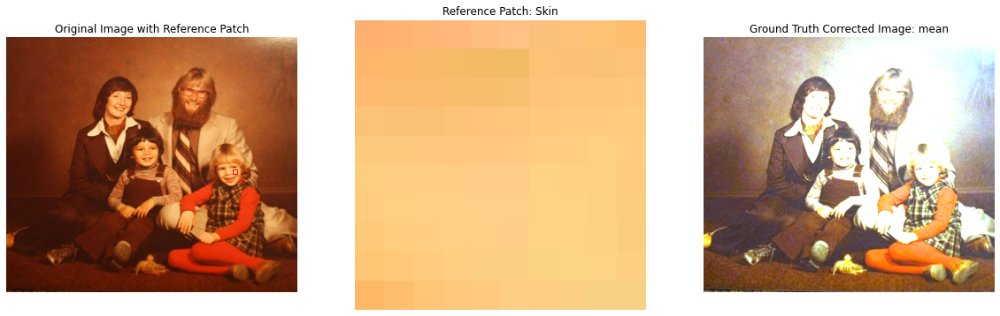

In [47]:
# Use mean method
ground_truth(image_collar, patch_coords_collar, patch_size_collar, mode='mean', patch_loc="Lady's Collar")
ground_truth(image_wall, patch_coords_wall, patch_size_wall, mode='mean', patch_loc="Wall")
ground_truth(image_skin, patch_coords_skin, patch_size_skin, mode='mean', patch_loc="Skin")

Output #17: Ground Truth Algorithm Results using the mean

Use the `mode=max`:

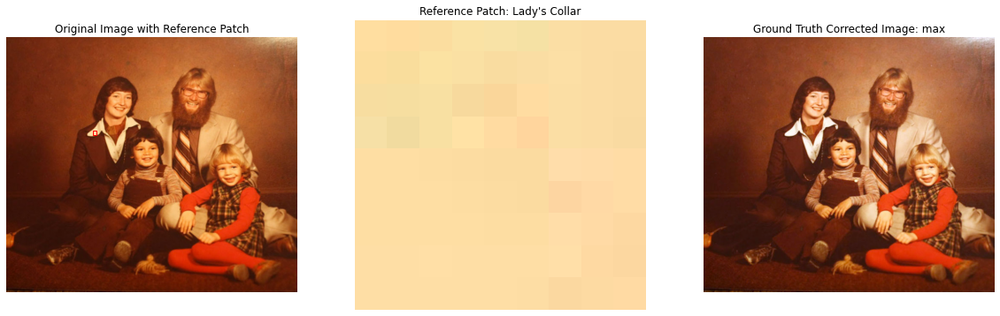

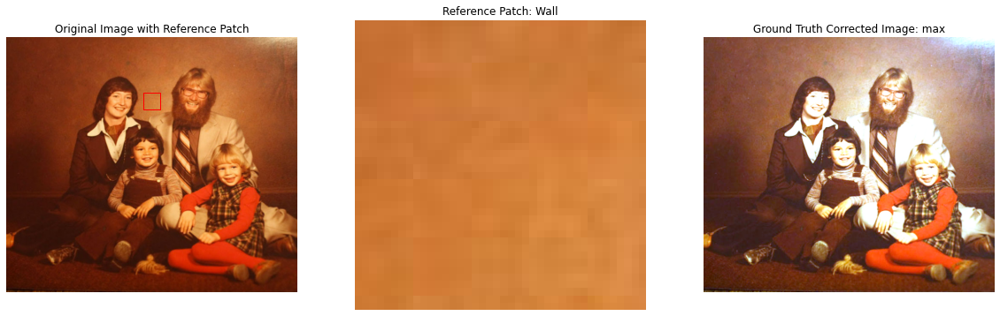

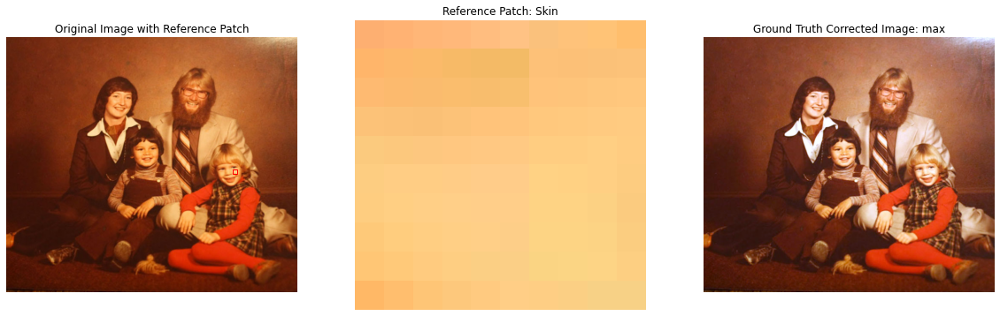

In [48]:
# Use max method
ground_truth(image_collar, patch_coords_collar, patch_size_collar, mode='max', patch_loc="Lady's Collar")
ground_truth(image_wall, patch_coords_wall, patch_size_wall, mode='max', patch_loc="Wall")
ground_truth(image_skin, patch_coords_skin, patch_size_skin, mode='max', patch_loc="Skin")

Output #18: Ground Truth Algorithm Results using the max


**Notes and Comments:**

- Since the **White Patch Algorithm** assumes that the brightest color in the image is white and scales the color channels based on the intensity of the brightest color, one would normally expect that using lower percentiles would yield underexposed images. However, in the case of the old-photo image, **uneven lighting** created different color casts and brightness levels across the image. As the percentile used decreased, the algorithm appeared to be selecting a color from an area with a different color cast, such as a shadowed region, leading to incorrect scaling of the color channels. This caused the brighter areas of the original image to become even more over-exposed, as the algorithm attempted to make the darker area appear as a neutral white, resulting in overcorrection that affected the entire image. This highlights the **limitations of the White Patch algorithm** when dealing with **unevenly lit images**. Despite this, the 99th percentile produced a corrected image with a natural-looking color balance, although some hints of the red overcast remained.

- As expected, the **Gray-world Algorithm** did performed worst among the three algorithms mainly because the image used did not satisfy the assumption that the average color of the image is gray. The existence of a dominant color, red overcast, made this algorithm unsuitable for improving the image.

- The **Ground Truth Algorithm** for color correction relies on the choice of the reference patch (ground truth, sub-images) and the calculation method ('mean' or 'max') to correct the image. Based on the results of the mean/max ground truth algorithm for each of the 3 sub-images, I've noted the following:

    - When it comes to the choice of the **reference patch**, it is crucial to choose a patch that is neutral white for accurate color correction. Among the 3 sub-images, the lady's collar seems to be the best white patch reference since the wall and skin colors aren't 100% white. Using the lady's collar as the reference patch yielded the best-corrected image among the 3 sub-images using the `max` method (more on this in the following points).

    - The image has **uneven lighting**, so using a single reference patch did not provide the most accurate results, especially when I used `mean` as the mode. Due to the uneven lighting, the exposure and brightness varied across the image, resulting in over-exposed portions in the upper right and middle areas of the image.

    - The choice between the `mean` and `max` methods depends on several factors, including the image's RGB statistics, the reference patch, and the lighting conditions. Using the `mean` method yielded an image with extremely bright (over-exposed) portions due to uneven lighting conditions, which displayed worse visuals than the original image. The `mean` method balances the color of the image based on the average color values to give it a more uniform adjustment in appearance. On the other hand, using the `max` method yielded a somewhat acceptable image correction but still with hints of red overcast. The `max` method balances the color of the image based on the maximum color values, resulting in a more contrasted and saturated appearance than the `mean`.

    - This particular exercise provides an example of situations when the ground truth algorithm should or should not be used. The ground truth algorithm should only be used if there is a known real white object in place (as our ground truth). It would not work if there is no known reference white patch or if it's ineffective due to complex lighting in the image. I also realized that using the `mean` method is only suitable for even lighting conditions with no extreme highlights or shadows, while using the `max` method is suitable for images with uneven lighting conditions, strong highlights, and deep shadows.
    
- Given that the white balancing techniques used did not completely eliminate the overcast, it’s important to combine these algorithms with more advanced color correction techniques that take into account uneven lighting and complex color casts. These techniques would enable us to achieve more suitable results, especially when dealing with images like the old-photo image that exhibit such characteristics.

---
<h2 style="color:#ff0090">Conclusion</h2>


All three white balancing algorithms reduced the color casts in the image. Ultimately, the choice of algorithm depends on the specific requirements and assumptions of your application. You can start by trying all three algorithms and selecting the most appropriate corrected image suitable to your liking. In general, the White Patch and Gray-world algorithms are suitable for general-purpose color correction, while the Ground Truth algorithm is ideal for professional applications where a reference white patch is available.

---

In this next part of our image enhancement journey, we’ll explore the powerful technique of histogram manipulation. Building on our previous explorations of Fourier Transform (Part 1) and White Balancing (Part 2, this Part), we’ll see how histograms can help bring out the best in our images. With histogram manipulation (Part 3), we can see into the future of our images and control the distribution of their values, almost like gazing into a plasma ball (you’ll get this reference in the next segment 😉)!

---
<h2 style="color:#ff0090">Reference</h2>

- Borja, B. (2023). Image Enhancement Assignment [Jupyter Notebook and Images]. Introduction to Image Processing 2023, Asian Institute of Management